In [30]:
pip install tqdm

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [31]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


## IMPORTING LIBRARIES

In [142]:
import tensorflow as tf
import keras
import os
import shutil
import cv2
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import pandas as pd
from tensorflow.keras.models import load_model

In [143]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np

In [4]:
import os
import shutil

img_path = r'C:\Users\HP\Desktop\BTP_2\indian-sign-language-translation-letters-n-digits'

for class1 in os.listdir(img_path):
    class_path = os.path.join(img_path, class1)

    if os.path.isdir(class_path):
        num_images = len(os.listdir(class_path))

        for (n, filename) in enumerate(os.listdir(class_path)):
            img = os.path.join(class_path, filename)

            for subfolder in ['test', 'train', 'val']:
                subfolder_path = os.path.join(subfolder, class1)
                if not os.path.exists(subfolder_path):
                    os.makedirs(subfolder_path)

            if n < int(0.1 * num_images):
                destination = os.path.join('test', class1, filename)
            elif n < int(0.8 * num_images):
                destination = os.path.join('train', class1, filename)
            else:
                destination = os.path.join('val', class1, filename)

            try:
                shutil.copyfile(img, destination)
            except Exception as e:
                print(f"Error copying {img} to {destination}: {e}")


In [ ]:
# def load_data(image_dir):
#     images = []
#     y = []
#     classNum = 0
#     for class1 in tqdm(os.listdir(image_dir)):
#         for file_name in os.listdir(os.path.join(image_dir,class1)):
#             images.append(cv2.imread(os.path.join(image_dir,class1,file_name)))
#             y.append(classNum)
#         classNum += 1
#     print(f'Loaded {len(images)} images from {image_dir} directory')
#     images = np.array(images)
#     y = np.array(y)
#     return images,y

In [5]:
import os
import cv2

image_dir = 'train/'  # Set this to the directory containing your images
image_shapes = []

for class1 in os.listdir(image_dir):
    for file_name in os.listdir(os.path.join(image_dir, class1)):
        image = cv2.imread(os.path.join(image_dir, class1, file_name))
        height, width, _ = image.shape
        image_shapes.append((height, width))

mean_height, mean_width = np.mean(image_shapes, axis=0)
std_height, std_width = np.std(image_shapes, axis=0)

print(f"Mean image height: {mean_height}, Mean image width: {mean_width}")
print(f"Standard deviation of image height: {std_height}, Standard deviation of image width: {std_width}")


Mean image height: 168.95257074531685, Mean image width: 173.47176830078385
Standard deviation of image height: 41.93610832976951, Standard deviation of image width: 41.617664424258415


In [6]:
def load_data(image_dir, target_shape=(height, width)):
    images = []
    y = []
    classNum = 0

    for class1 in tqdm(os.listdir(image_dir)):
        for file_name in os.listdir(os.path.join(image_dir, class1)):
            image = cv2.imread(os.path.join(image_dir, class1, file_name))
            
            # Resize the image to a consistent shape (e.g., height, width)
            image = cv2.resize(image, target_shape)
            
            images.append(image)
            y.append(classNum)

        classNum += 1

    print(f'Loaded {len(images)} images from {image_dir} directory')
    images = np.array(images)
    y = np.array(y)
    return images, y


In [7]:
# Define the target shape based on your analysis
# As the mean height and width of the dataset is around 180 
target_shape = (180, 180, 3)

In [8]:
train_images, train_labels = load_data('train/')
test_images, test_labels = load_data('test/')
val_images, val_labels = load_data('val/')

100%|██████████| 33/33 [00:13<00:00,  2.41it/s]


Loaded 7527 images from train/ directory


100%|██████████| 33/33 [00:08<00:00,  3.85it/s]


Loaded 1074 images from test/ directory


100%|██████████| 33/33 [00:15<00:00,  2.14it/s]

Loaded 2151 images from val/ directory


In [9]:
arr = [i for i in range(10)] + [chr(ord('a')+i) for i in range(26)]
arr.remove('v')
arr.remove('h')
arr.remove('j')
label_dicts = {i:arr[i] for i in range(len(arr))}
label_dicts

{0: 0,
 1: 1,
 2: 2,
 3: 3,
 4: 4,
 5: 5,
 6: 6,
 7: 7,
 8: 8,
 9: 9,
 10: 'a',
 11: 'b',
 12: 'c',
 13: 'd',
 14: 'e',
 15: 'f',
 16: 'g',
 17: 'i',
 18: 'k',
 19: 'l',
 20: 'm',
 21: 'n',
 22: 'o',
 23: 'p',
 24: 'q',
 25: 'r',
 26: 's',
 27: 't',
 28: 'u',
 29: 'w',
 30: 'x',
 31: 'y',
 32: 'z'}

In [ ]:
# def show_samples(X,y,n=30):
#     classes = np.unique(y)
#     classNo = 0
#     for class1 in classes:
#         imgs = X[y == class1][:n]
#         j = 10
#         i = n // 10
#         plt.figure(figsize=(15,1))
#         for (c,img) in enumerate(imgs,1):
#             plt.subplot(i,j,c)
#             plt.imshow(img)
#             plt.xticks([])
#             plt.yticks([])
#         plt.suptitle(f'Digit/Letter: {label_dicts[class1]}')
#         classNo += 1
#         if classNo == 15: 
#             break

In [10]:
def show_samples(X, y, n=5):
    classes = np.unique(y)
    fig, axs = plt.subplots(len(classes), n, figsize=(15, 2 * len(classes)))

    for i, class1 in enumerate(classes):
        class_indices = np.where(y == class1)[0]  # Get indices of samples belonging to this class
        class_indices = class_indices[:n]  # Select the first 5 indices for this class
        for j, idx in enumerate(class_indices):
            axs[i, j].imshow(X[idx])
            axs[i, j].axis('off')

        axs[i, 0].set_title(f'Digit/Letter: {label_dicts[class1]}')

        # Hide remaining subplots if there are fewer than 5 images for a class
        for j in range(len(class_indices), n):
            axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()

In [11]:
datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.05,
        zoom_range=(0.8,1.2),
        width_shift_range=0.05,
        height_shift_range=0.05,
        rotation_range=30,
        brightness_range=(0.5,1.5),
        channel_shift_range=1,
        horizontal_flip=True)

train_generator = datagen.flow_from_directory(
        'train/',
        target_size=(224,224),
        batch_size=350,
        class_mode='categorical')

test_generator = datagen.flow_from_directory(
        'test/',
        target_size=(224,224),
        batch_size=200,
        class_mode='categorical',
        shuffle = False)


valid_generator = datagen.flow_from_directory(
        'val/',
        target_size=(224,224),
        batch_size=100,
        class_mode='categorical')
# plt.imshow(train_generator.next()[0].reshape(140,160,3))

Found 7527 images belonging to 33 classes.
Found 1074 images belonging to 33 classes.
Found 2151 images belonging to 33 classes.


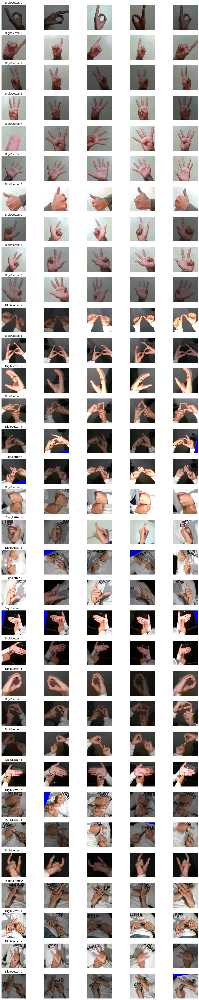

In [ ]:
batch1 = train_generator.next()
show_samples(batch1[0], batch1[1].argmax(axis=1),n=5)

In [12]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense, MaxPooling2D

In [ ]:
# model = Sequential()

# model.add(Conv2D(16,kernel_size=8,activation='relu',input_shape=(224,224,3),padding='same'))
# model.add(MaxPooling2D(pool_size=(8,8),strides=(8,8),padding='same'))
# model.add(Conv2D(32,kernel_size=3,activation='relu',padding='same'))
# model.add(MaxPooling2D(pool_size=(4,4),strides=(4,4),padding='same'))
# model.add(Conv2D(64,kernel_size=3,activation='relu',padding='same'))
# model.add(Flatten())
# model.add(Dense(len(label_dicts),activation='softmax'))

In [13]:
# calculating the number of classes in train folder so we can use it as the output dimension for our CNN
number_classes_train=0
rootdir = r"C:\Users\HP\Desktop\BTP_2\train"
for file in os.listdir(rootdir):
    d = os.path.join(rootdir, file)
    if os.path.isdir(d):
        number_classes_train=number_classes_train+1
        print(d)
print(number_classes_train)

C:\Users\HP\Desktop\BTP_2\train\0
C:\Users\HP\Desktop\BTP_2\train\1
C:\Users\HP\Desktop\BTP_2\train\2
C:\Users\HP\Desktop\BTP_2\train\3
C:\Users\HP\Desktop\BTP_2\train\4
C:\Users\HP\Desktop\BTP_2\train\5
C:\Users\HP\Desktop\BTP_2\train\6
C:\Users\HP\Desktop\BTP_2\train\7
C:\Users\HP\Desktop\BTP_2\train\8
C:\Users\HP\Desktop\BTP_2\train\9
C:\Users\HP\Desktop\BTP_2\train\a
C:\Users\HP\Desktop\BTP_2\train\b
C:\Users\HP\Desktop\BTP_2\train\c
C:\Users\HP\Desktop\BTP_2\train\d
C:\Users\HP\Desktop\BTP_2\train\e
C:\Users\HP\Desktop\BTP_2\train\f
C:\Users\HP\Desktop\BTP_2\train\g
C:\Users\HP\Desktop\BTP_2\train\i
C:\Users\HP\Desktop\BTP_2\train\k
C:\Users\HP\Desktop\BTP_2\train\l
C:\Users\HP\Desktop\BTP_2\train\m
C:\Users\HP\Desktop\BTP_2\train\n
C:\Users\HP\Desktop\BTP_2\train\o
C:\Users\HP\Desktop\BTP_2\train\p
C:\Users\HP\Desktop\BTP_2\train\q
C:\Users\HP\Desktop\BTP_2\train\r
C:\Users\HP\Desktop\BTP_2\train\s
C:\Users\HP\Desktop\BTP_2\train\t
C:\Users\HP\Desktop\BTP_2\train\u
C:\Users\HP\De

In [14]:
model = Sequential()

model.add(Conv2D(16,kernel_size=8,activation='relu',input_shape=(224,224,3),padding='same'))
model.add(MaxPooling2D(pool_size=(8,8),strides=(8,8),padding='same'))
model.add(Conv2D(32,kernel_size=3,activation='relu',padding='same'))
model.add(MaxPooling2D(pool_size=(4,4),strides=(4,4),padding='same'))
model.add(Conv2D(64,kernel_size=3,activation='relu',padding='same'))
model.add(Flatten())
model.add(Dense(number_classes_train,activation='softmax'))

In [15]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.01,
    decay_steps=8000,
    decay_rate=0.01)
opt = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
model.compile(optimizer=opt,loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
train_step_size = train_generator.n//train_generator.batch_size
val_step_size = valid_generator.n//valid_generator.batch_size
history = model.fit_generator(
        train_generator,
        steps_per_epoch=train_step_size,
        validation_data=valid_generator,
        validation_steps=val_step_size,
        epochs=15)

C:\Users\HP\AppData\Local\Temp\ipykernel_18588\94071696.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/15


21/21 [==============================] - 175s 8s/step - loss: 3.0581 - accuracy: 0.1719 - val_loss: 1.9113 - val_accuracy: 0.3886
Epoch 2/15
21/21 [==============================] - 158s 8s/step - loss: 1.1048 - accuracy: 0.6669 - val_loss: 0.7434 - val_accuracy: 0.7871
Epoch 3/15
21/21 [==============================] - 172s 8s/step - loss: 0.4838 - accuracy: 0.8495 - val_loss: 0.5660 - val_accuracy: 0.8300
Epoch 4/15
21/21 [==============================] - 182s 9s/step - loss: 0.3045 - accuracy: 0.9059 - val_loss: 0.3953 - val_accuracy: 0.8948
Epoch 5/15
21/21 [==============================] - 166s 8s/step - loss: 0.2384 - accuracy: 0.9260 - val_loss: 0.3341 - val_accuracy: 0.9052
Epoch 6/15
21/21 [==============================] - 157s 8s/step - loss: 0.1886 - accuracy: 0.9425 - val_loss: 0.3013 - val_accuracy: 0.9129
Epoch 7/15
21/21 [==============================] - 160s 8s/step - loss: 0.1551 - accuracy: 0.9569 - val_loss: 0.2344 - val_accuracy: 0.9371
Epoch 8/15


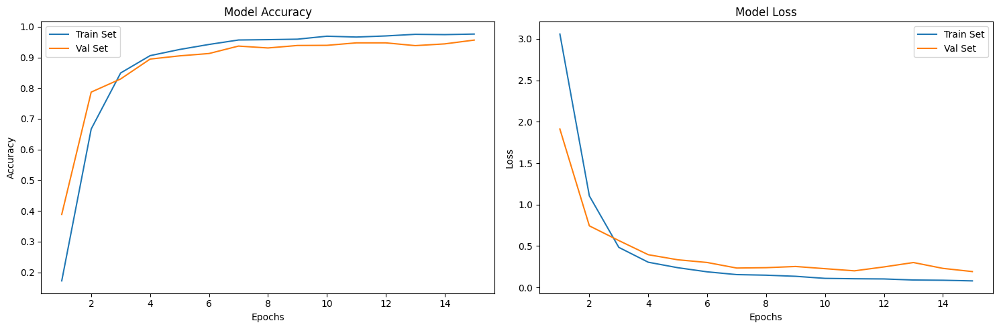

In [ ]:
# plot model performance
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(history.epoch) + 1)

plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Train Set')
plt.plot(epochs_range, val_acc, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Train Set')
plt.plot(epochs_range, val_loss, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Model Loss')

plt.tight_layout()
plt.show()

In [ ]:
model.evaluate_generator(valid_generator)

C:\Users\HP\AppData\Local\Temp\ipykernel_18588\992553626.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  model.evaluate_generator(valid_generator)


[0.1817844808101654, 0.9530450701713562]

# TEST ACCURACY

In [ ]:
model.save('ISL_HandPoses_CNN_.h5')

e:\Program Files\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [16]:
# Load the saved model
loaded_model = load_model('ISL_HandPoses_CNN_.h5')

In [146]:
loaded_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 16)      3088      
                                                                 
 max_pooling2d (MaxPooling2  (None, 28, 28, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 28, 28, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 7, 7, 32)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 64)          18496     
                                                                 
 flatten (Flatten)           (None, 3136)              0

In [17]:
# LOSS AND ACCURACY ON UNSEEN TEST DATA SET
evaluation_result = loaded_model.evaluate_generator(test_generator)
formatted_loss = "{:.5f}".format(evaluation_result[0])
formatted_accuracy = "{:.4f}".format(evaluation_result[1] * 100)

print(f"Loss for Test Dataset: {formatted_loss}")
print(f"Accuracy for Test Dataset: {formatted_accuracy}%")


C:\Users\HP\AppData\Local\Temp\ipykernel_4752\3486656429.py:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  evaluation_result = loaded_model.evaluate_generator(test_generator)



Loss for Test Dataset: 0.11509
Accuracy for Test Dataset: 96.2756%


### CLASSWISE ACCYRACY FOR TEST DATASET

In [18]:
# Get predictions for the test set
predictions = loaded_model.predict_generator(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

C:\Users\HP\AppData\Local\Temp\ipykernel_4752\4120394195.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predictions = loaded_model.predict_generator(test_generator)


In [19]:
# Get true labels for the test set
true_labels = []
for i in range(len(test_generator)):
    _, labels = test_generator[i]
    true_labels.extend(np.argmax(labels, axis=1))

true_labels = np.array(true_labels)

In [20]:
# printing confusion matrix
y_pred = np.argmax(predictions, axis=1)

cm=confusion_matrix(true_labels, y_pred)
print(cm)

[[65  0  0 ...  0  0  0]
 [ 0 30  0 ...  0  0  0]
 [ 0 11 19 ...  0  0  0]
 ...
 [ 0  0  0 ... 27  0  0]
 [ 0  0  0 ...  0 30  0]
 [ 0  0  0 ...  0  0 27]]


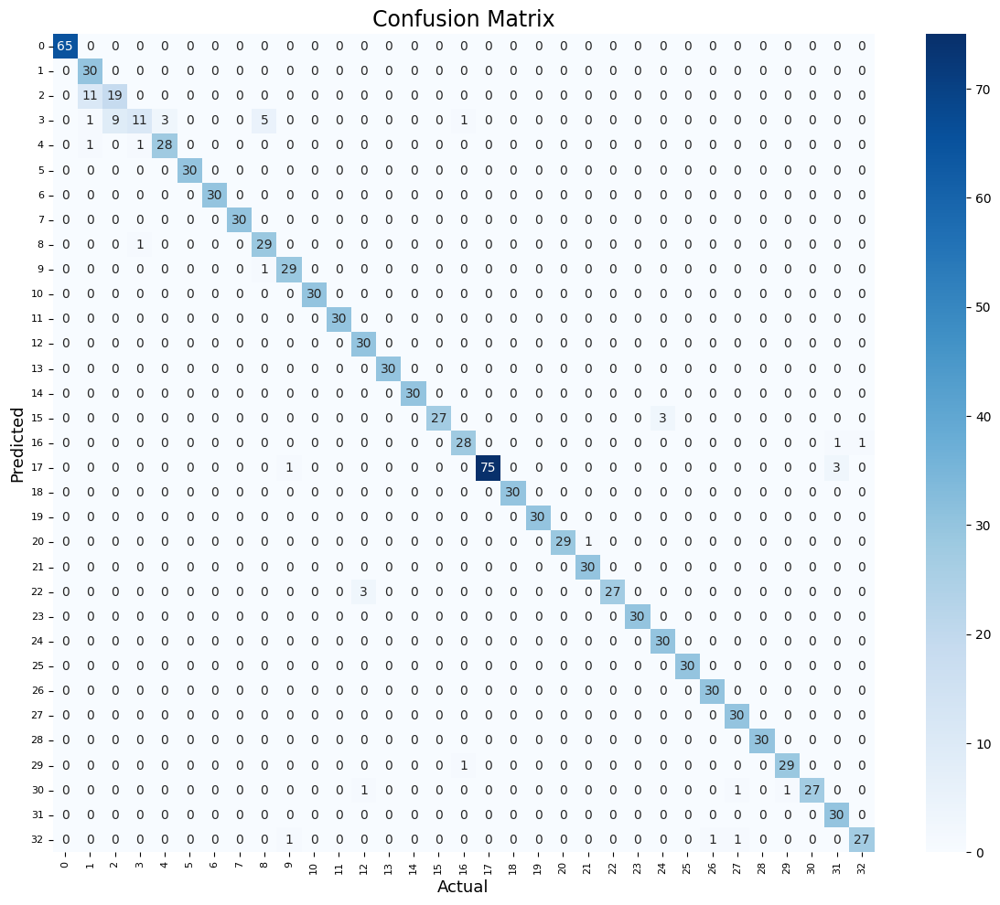

In [150]:
plt.figure(figsize=(12, 10))

# Create a heatmap with adjusted aesthetics
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')

plt.ylabel('Predicted', fontsize=13)
plt.xlabel('Actual', fontsize=13)
plt.title('Confusion Matrix', fontsize=17)

# Adjust tick labels for better readability and alignment
plt.xticks(ticks=np.arange(len(label_dicts))+0.5, labels=label_dicts, rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(label_dicts))+0.5, labels=label_dicts, rotation=0, fontsize=8)

plt.tight_layout()
plt.show()


In [22]:
# Calculate class-wise accuracy
class_wise_accuracy = cm.diagonal() / cm.sum(axis=0)
#print(class_wise_accuracy)


In [23]:
# Create a dictionary to store class-wise accuracies
classwise_acc_dict = {f'Class_{i}': acc for i, acc in enumerate(class_wise_accuracy)}
print(classwise_acc_dict)


{'Class_0': 1.0, 'Class_1': 0.6976744186046512, 'Class_2': 0.6785714285714286, 'Class_3': 0.8461538461538461, 'Class_4': 0.9032258064516129, 'Class_5': 1.0, 'Class_6': 1.0, 'Class_7': 1.0, 'Class_8': 0.8285714285714286, 'Class_9': 0.9354838709677419, 'Class_10': 1.0, 'Class_11': 1.0, 'Class_12': 0.8823529411764706, 'Class_13': 1.0, 'Class_14': 1.0, 'Class_15': 1.0, 'Class_16': 0.9333333333333333, 'Class_17': 1.0, 'Class_18': 1.0, 'Class_19': 1.0, 'Class_20': 1.0, 'Class_21': 0.967741935483871, 'Class_22': 1.0, 'Class_23': 1.0, 'Class_24': 0.9090909090909091, 'Class_25': 1.0, 'Class_26': 0.967741935483871, 'Class_27': 0.9375, 'Class_28': 1.0, 'Class_29': 0.9666666666666667, 'Class_30': 1.0, 'Class_31': 0.8823529411764706, 'Class_32': 0.9642857142857143}


In [ ]:
# Calculate class-wise accuracy
# class_wise_accuracy = []
# number_classes_test = len(np.unique(true_labels))

# for class_idx in range(number_classes_test):  # Assuming number_classes_test represents the total number of classes
#     class_indices = np.where(true_labels == class_idx)[0]
#     class_predictions = predicted_classes[class_indices]
#     class_accuracy = np.mean(class_predictions == class_idx)
#     class_wise_accuracy.append(class_accuracy)

# # Print class-wise accuracy
# for class_idx, accuracy in enumerate(class_wise_accuracy):
#     print(f'Class {class_idx} Accuracy: {accuracy:.4f}')

In [24]:
from sklearn.metrics import accuracy_score

# Calculate overall test accuracy
overall_test_accuracy = accuracy_score(true_labels, predicted_classes)
print(f'Overall Test Accuracy: {overall_test_accuracy:.4f}')

print("===========================")

# Print class-wise accuracy
for class_idx, accuracy in enumerate(class_wise_accuracy):
    print(f'Class {class_idx} Accuracy: {accuracy:.4f}')


Overall Test Accuracy: 0.9497
Class 0 Accuracy: 1.0000
Class 1 Accuracy: 0.6977
Class 2 Accuracy: 0.6786
Class 3 Accuracy: 0.8462
Class 4 Accuracy: 0.9032
Class 5 Accuracy: 1.0000
Class 6 Accuracy: 1.0000
Class 7 Accuracy: 1.0000
Class 8 Accuracy: 0.8286
Class 9 Accuracy: 0.9355
Class 10 Accuracy: 1.0000
Class 11 Accuracy: 1.0000
Class 12 Accuracy: 0.8824
Class 13 Accuracy: 1.0000
Class 14 Accuracy: 1.0000
Class 15 Accuracy: 1.0000
Class 16 Accuracy: 0.9333
Class 17 Accuracy: 1.0000
Class 18 Accuracy: 1.0000
Class 19 Accuracy: 1.0000
Class 20 Accuracy: 1.0000
Class 21 Accuracy: 0.9677
Class 22 Accuracy: 1.0000
Class 23 Accuracy: 1.0000
Class 24 Accuracy: 0.9091
Class 25 Accuracy: 1.0000
Class 26 Accuracy: 0.9677
Class 27 Accuracy: 0.9375
Class 28 Accuracy: 1.0000
Class 29 Accuracy: 0.9667
Class 30 Accuracy: 1.0000
Class 31 Accuracy: 0.8824
Class 32 Accuracy: 0.9643


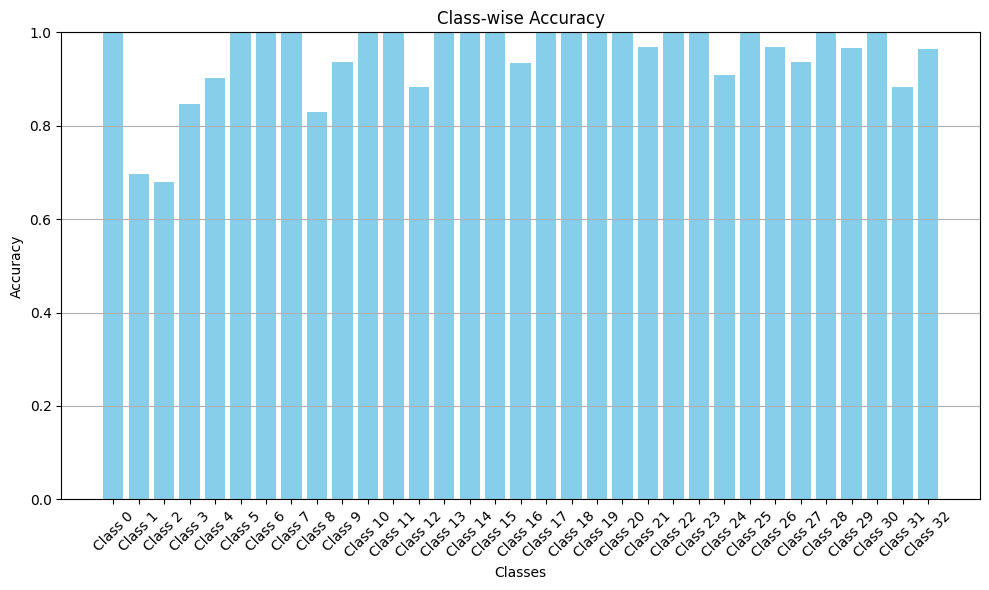

In [25]:
import matplotlib.pyplot as plt

# Calculate class-wise accuracy and prepare labels
class_labels = [f'Class {class_idx}' for class_idx in range(len(class_wise_accuracy))]

plt.figure(figsize=(10, 6))
plt.bar(class_labels, class_wise_accuracy, color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Accuracy')
plt.title('Class-wise Accuracy')
plt.ylim(0, 1)  # Set y-axis limit to range between 0 and 1 (for accuracy)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability if needed
plt.grid(axis='y')  # Add horizontal gridlines
plt.tight_layout()
plt.show()


==============================================================================================================

# LALYER 2

### MISCLASSIFICATIONS 

In [87]:
threshold = 4  # Adjust this threshold based on the confusion count you consider significant

high_confusion_classes = set()
for true_idx, true_class in label_dicts.items():
    misclassified_classes = []
    for pred_idx, pred_name in label_dicts.items():
        if cm[pred_idx, true_idx] > threshold and true_class != pred_name:
            misclassified_classes.append(pred_idx)
    if len(misclassified_classes) > 0:
        print(f"For class {true_idx}, high confusion with: {misclassified_classes}")
        high_confusion_classes.add(true_idx)
        high_confusion_classes.update(misclassified_classes)

print("Classes that exhibit high confusion within themselves:", high_confusion_classes)


For class 1, high confusion with: [2]
For class 2, high confusion with: [3]
For class 8, high confusion with: [3]
Classes that exhibit high confusion within themselves: {8, 1, 2, 3}


#### Step 1: Filter Data for High-Confusion Classes

In [61]:
main_training_directory = r"C:\Users\HP\Desktop\BTP_2\train"
main_test_directory= r"C:\Users\HP\Desktop\BTP_2\test"
main_val_directory= r"C:\Users\HP\Desktop\BTP_2\val"

# Create paths to high-confusion class directories within the main training directory
high_confusion_train_folders = [
     str(label_dicts[idx]) for idx in high_confusion_classes
]

# Create a generator for the high-confusion classes in the train set
high_confusion_train_generator = datagen.flow_from_directory(
    main_training_directory,  # Path to the main training directory
    classes=high_confusion_train_folders,
    target_size=(224, 224),
    batch_size=128,
    class_mode='categorical'
)
# Create a generator for the high-confusion classes in the train set
high_confusion_test_generator = datagen.flow_from_directory(
    main_test_directory,  # Path to the main training directory
    classes=high_confusion_train_folders,
    target_size=(224, 224),
    batch_size=128,
    class_mode='categorical',
    shuffle = False
)
# Create a generator for the high-confusion classes in the train set
high_confusion_val_generator = datagen.flow_from_directory(
    main_val_directory,  # Path to the main training directory
    classes=high_confusion_train_folders,
    target_size=(224, 224),
    batch_size=128,
    class_mode='categorical'
)


Found 840 images belonging to 4 classes.
Found 120 images belonging to 4 classes.
Found 240 images belonging to 4 classes.


In [126]:
# Creating a dictionary with indexes as keys and set elements as values
high_confusion_classes_dict = {idx: value for idx, value in enumerate(high_confusion_classes)}

print(high_confusion_classes_dict)

{0: 8, 1: 1, 2: 2, 3: 3}


In [127]:
def show_samples_layer2(X, y, n=5):
    classes = np.unique(y)
    fig, axs = plt.subplots(len(classes), n, figsize=(15, 2 * len(classes)))

    for i, class1 in enumerate(classes):
        class_indices = np.where(y == class1)[0]  # Get indices of samples belonging to this class
        class_indices = class_indices[:n]  # Select the first 5 indices for this class
        for j, idx in enumerate(class_indices):
            axs[i, j].imshow(X[idx])
            axs[i, j].axis('off')

        axs[i, 0].set_title(f'Digit/Letter: {high_confusion_classes_dict[class1]}')

        # Hide remaining subplots if there are fewer than 5 images for a class
        for j in range(len(class_indices), n):
            axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()

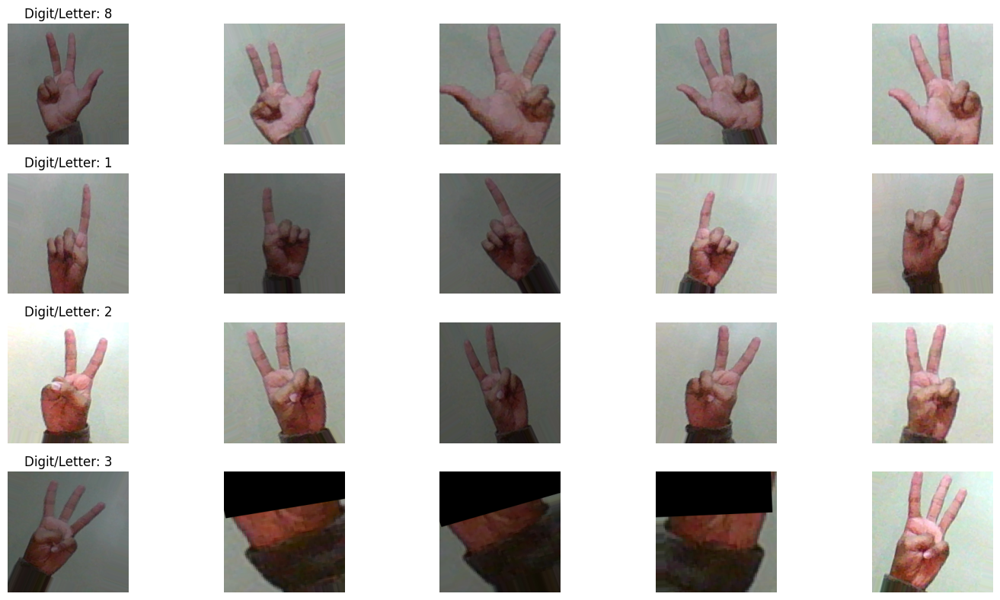

In [128]:
batch2 = high_confusion_train_generator.next()
show_samples_layer2(batch2[0], batch2[1].argmax(axis=1),n=5)

#### Step 2: Build and Train a Secondary CNN Model

In [43]:
# Initialize a Sequential model
high_confusion_model = Sequential()

# Add layers to the model
high_confusion_model.add(Conv2D(32, kernel_size=5, activation='relu', input_shape=(224, 224, 3), padding='same'))
high_confusion_model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same'))

high_confusion_model.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
high_confusion_model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same'))

high_confusion_model.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
high_confusion_model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same'))

high_confusion_model.add(Flatten())
high_confusion_model.add(Dense(256, activation='relu'))
high_confusion_model.add(Dense(len(high_confusion_classes), activation='softmax'))  # Output layer for the high-confusion classes

# Compile the model
high_confusion_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [77]:
high_confusion_train_step_size = high_confusion_train_generator.n//high_confusion_train_generator.batch_size
high_confusion_val_step_size = high_confusion_val_generator.n//high_confusion_val_generator.batch_size
high_confusion_model.fit_generator(
    high_confusion_train_generator,
    steps_per_epoch=high_confusion_train_step_size,  # Define the number of steps per epoch
    epochs=15,
    validation_data=high_confusion_val_generator,
    validation_steps= high_confusion_val_step_size # Define the number of validation steps
)


C:\Users\HP\AppData\Local\Temp\ipykernel_4752\1177101649.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  high_confusion_model.fit_generator(


Epoch 1/15
6/6 [==============================] - 60s 8s/step - loss: 0.6609 - accuracy: 0.7472 - val_loss: 0.8261 - val_accuracy: 0.6484
Epoch 2/15
6/6 [==============================] - 40s 6s/step - loss: 0.5318 - accuracy: 0.8076 - val_loss: 0.6514 - val_accuracy: 0.8047
Epoch 3/15
6/6 [==============================] - 39s 6s/step - loss: 0.4327 - accuracy: 0.8553 - val_loss: 0.5728 - val_accuracy: 0.7969
Epoch 4/15
6/6 [==============================] - 37s 6s/step - loss: 0.3587 - accuracy: 0.8961 - val_loss: 0.6467 - val_accuracy: 0.8281
Epoch 5/15
6/6 [==============================] - 39s 6s/step - loss: 0.3179 - accuracy: 0.8904 - val_loss: 0.5138 - val_accuracy: 0.8438
Epoch 6/15
6/6 [==============================] - 40s 6s/step - loss: 0.2570 - accuracy: 0.9185 - val_loss: 0.4728 - val_accuracy: 0.8359
Epoch 7/15
6/6 [==============================] - 39s 6s/step - loss: 0.2560 - accuracy: 0.9087 - val_loss: 0.6923 - val_accuracy: 0.7578
Epoch 8/15
6/6 [==================

In [78]:
high_confusion_model.save('LAYER_2_ISL_HandPoses_CNN_.h5')

e:\Program Files\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [79]:
# Load the saved model
loaded_high_confusion_model = load_model('LAYER_2_ISL_HandPoses_CNN_.h5')

In [149]:
loaded_high_confusion_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 224, 224, 32)      2432      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 112, 112, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 56, 56, 128)       73856     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 28, 28, 128)      

In [ ]:
# # plot model performance
# high_confusion_acc = loaded_high_confusion_model.history['accuracy']
# high_confusion_val_acc = loaded_high_confusion_model.history['val_accuracy']
# high_confusion_loss = loaded_high_confusion_model.history['loss']
# high_confusion_val_loss = loaded_high_confusion_model.history['val_loss']
# high_confusion_epochs_range = range(1, len(loaded_high_confusion_model.epoch) + 1)

# plt.figure(figsize=(15,5))

# plt.subplot(1, 2, 1)
# plt.plot(high_confusion_epochs_range, high_confusion_acc, label='High confusion Train Set')
# plt.plot(high_confusion_epochs_range, high_confusion_val_acc, label='High Confusion Val Set')
# plt.legend(loc="best")
# plt.xlabel('Epochs')
# plt.ylabel('Accuracy')
# plt.title('Model Accuracy')

# plt.subplot(1, 2, 2)
# plt.plot(high_confusion_epochs_range, high_confusion_loss, label='High Confusion Train Set')
# plt.plot(high_confusion_epochs_range, high_confusion_val_loss, label='High Confusion Val Set')
# plt.legend(loc="best")
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.title('Model Loss')

# plt.tight_layout()
# plt.show()

## TEST ACCURACY FOR LAYER2 MODEL

In [90]:
# TEST ACCURACY ON LAYER 2 MODEL
loaded_high_confusion_model.evaluate_generator(high_confusion_test_generator)

C:\Users\HP\AppData\Local\Temp\ipykernel_4752\833917418.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  loaded_high_confusion_model.evaluate_generator(high_confusion_test_generator)


[0.1663156896829605, 0.949999988079071]

In [80]:
# Get predictions for the test set using the initial model (layer 1)
predictions_layer1 = loaded_model.predict_generator(test_generator)
predicted_classes_layer1 = np.argmax(predictions_layer1, axis=1)

C:\Users\HP\AppData\Local\Temp\ipykernel_4752\1688037165.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predictions_layer1 = loaded_model.predict_generator(test_generator)


In [81]:
# Get true labels for the test set(LAYER1)
true_labels_layer1 = []
for i in range(len(test_generator)):
    _, labels = test_generator[i]
    true_labels_layer1.extend(np.argmax(labels, axis=1))

true_labels_layer1 = np.array(true_labels_layer1)

In [134]:
exp_high_confusion_predictions = loaded_high_confusion_model.predict(np.expand_dims(test_generator[0][0][59 % test_generator.batch_size], axis=0))
        
exp_high_confusion_predicted_classes = np.argmax(exp_high_confusion_predictions, axis=1)
high_confusion_classes_dict[exp_high_confusion_predicted_classes[0]]

1/1 [==============================] - 0s 61ms/step


3

In [ ]:
import matplotlib.pyplot as plt

# Assuming you have an index 'i' and 'idx' set to specific values
i = 0  # Replace this with the desired index within the batch
idx = 0  # Replace this with the desired index of the batch

# Access the image using np.expand_dims and visualize it
image = np.expand_dims(test_generator[idx][0][i % test_generator.batch_size], axis=0)

# Plot the image
plt.imshow(image[0])  # Accessing the image from the first dimension (axis=0)
plt.axis('off')  # Turn off axis labels for clarity
plt.show()


In [135]:
# Initialize arrays for combined predictions and true labels
combined_predictions = np.empty(len(true_labels_layer1), dtype=int)

# Logic for combining predictions
idx = 0

for i, (pred_class_layer1, true_label_layer1) in enumerate(zip(predicted_classes_layer1, true_labels_layer1)):
    if true_label_layer1 in high_confusion_classes:
        #print("========",true_label_layer1,"===========")
        # Use prediction from layer 2 (loaded_high_confusion_model) for high-confusion classes
        high_confusion_predictions = loaded_high_confusion_model.predict(np.expand_dims(test_generator[idx][0][i % test_generator.batch_size], axis=0))
        
        high_confusion_predicted_classes = np.argmax(high_confusion_predictions, axis=1)
        combined_predictions[i] = high_confusion_classes_dict[high_confusion_predicted_classes[0]]
    else:
        # Use prediction from layer 1 for regular classes
        combined_predictions[i] = pred_class_layer1
    
    # Increment the index when crossing batch boundaries
    if (i + 1) % test_generator.batch_size == 0:
        idx += 1
       

# Calculate the combined confusion matrix
combined_confusion_matrix = confusion_matrix(true_labels, combined_predictions)
print("Combined Confusion Matrix:")
print(combined_confusion_matrix)


1/1 [==============================] - 0s 39ms/step
Combined Confusion Matrix:
[[65  0  0 ...  0  0  0]
 [ 0 30  0 ...  0  0  0]
 [ 0  0 30 ...  0  0  0]
 ...
 [ 0  0  0 ... 25  0  0]
 [ 0  0  0 ...  0 29  0]
 [ 0  0  0 ...  0  0 29]]


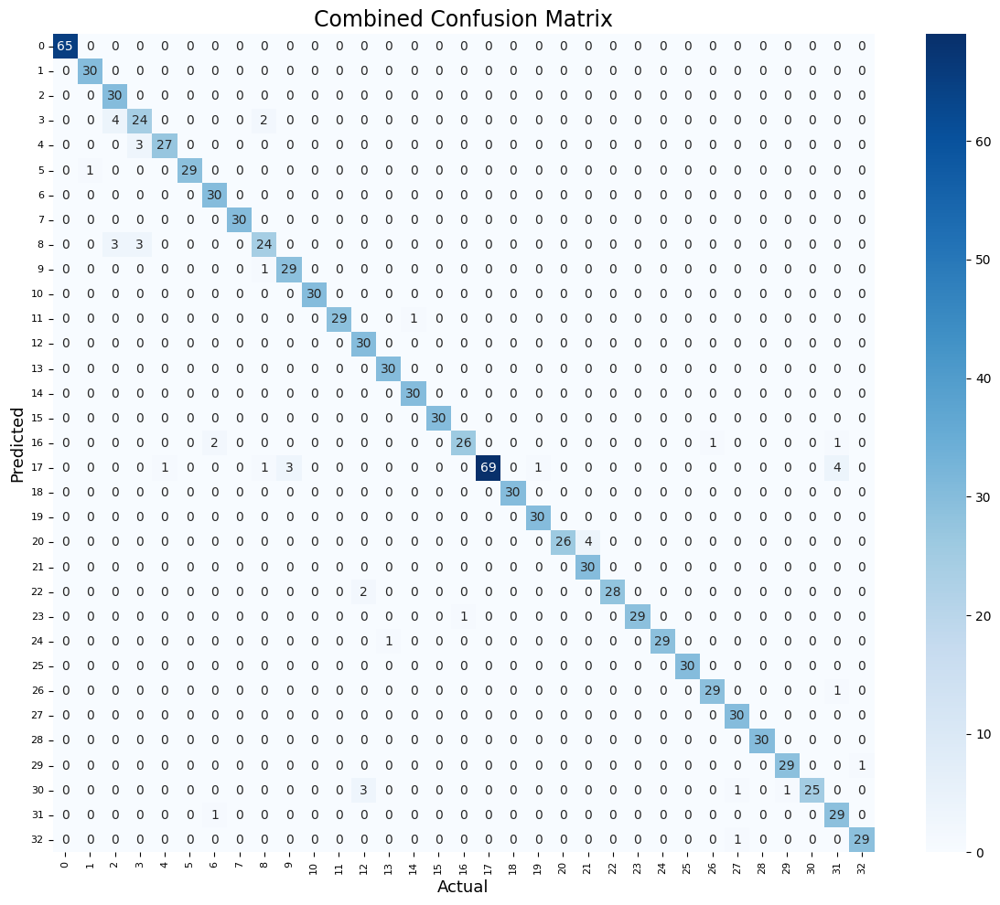

In [151]:
plt.figure(figsize=(12, 10))

# Create a heatmap with adjusted aesthetics
sns.heatmap(combined_confusion_matrix, annot=True, fmt='g', cmap='Blues')

plt.ylabel('Predicted', fontsize=13)
plt.xlabel('Actual', fontsize=13)
plt.title('Combined Confusion Matrix', fontsize=17)

# Adjust tick labels for better readability and alignment
plt.xticks(ticks=np.arange(len(label_dicts))+0.5, labels=label_dicts, rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(label_dicts))+0.5, labels=label_dicts, rotation=0, fontsize=8)

plt.tight_layout()
plt.show()


In [139]:
# Calculate class-wise accuracy
high_confusion_class_wise_accuracy = combined_confusion_matrix.diagonal() / combined_confusion_matrix.sum(axis=0)
#print(class_wise_accuracy)

In [4]:
from sklearn.metrics import accuracy_score

# Calculate overall test accuracy
high_confusion_overall_test_accuracy = accuracy_score(true_labels_layer1, predicted_classes_layer1)
print(f'Overall Test Accuracy after addition of LAYER 2: {high_confusion_overall_test_accuracy:.4f}')

print("===========================")

# Print class-wise accuracy
for class_idx, accuracy in enumerate(high_confusion_class_wise_accuracy):
    print(f'Class {class_idx} Accuracy: {accuracy:.4f}')



Overall Test Accuracy after addition of LAYER 2: 0.9667
Class 0 Accuracy: 1.0000
Class 1 Accuracy: 0.9677
Class 2 Accuracy: 0.8108
Class 3 Accuracy: 0.8000
Class 4 Accuracy: 0.9643
Class 5 Accuracy: 1.0000
Class 6 Accuracy: 0.9091
Class 7 Accuracy: 1.0000
Class 8 Accuracy: 0.8571
Class 9 Accuracy: 0.9062
Class 10 Accuracy: 1.0000
Class 11 Accuracy: 1.0000
Class 12 Accuracy: 0.8571
Class 13 Accuracy: 0.9677
Class 14 Accuracy: 0.9677
Class 15 Accuracy: 1.0000
Class 16 Accuracy: 0.9630
Class 17 Accuracy: 1.0000
Class 18 Accuracy: 1.0000
Class 19 Accuracy: 0.9677
Class 20 Accuracy: 1.0000
Class 21 Accuracy: 0.8824
Class 22 Accuracy: 1.0000
... (and so on)
Class 29 Accuracy: 0.9667
Class 30 Accuracy: 1.0000
Class 31 Accuracy: 0.8286
Class 32 Accuracy: 0.9667



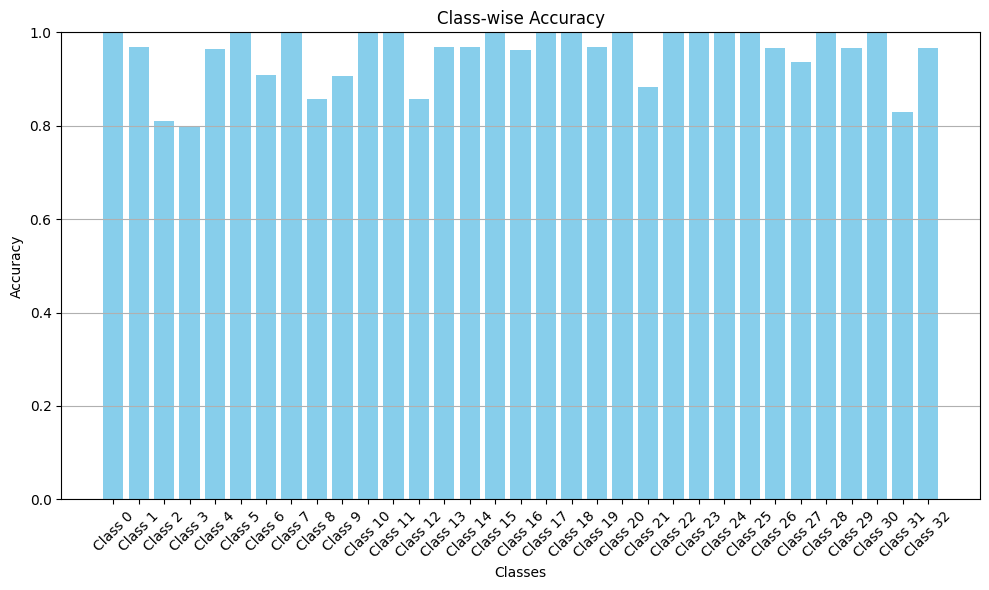

In [141]:
import matplotlib.pyplot as plt

# Calculate class-wise accuracy and prepare labels
high_confusion_class_labels = [f'Class {class_idx}' for class_idx in range(len(high_confusion_class_wise_accuracy))]

plt.figure(figsize=(10, 6))
plt.bar(high_confusion_class_labels, high_confusion_class_wise_accuracy, color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Accuracy')
plt.title('Class-wise Accuracy')
plt.ylim(0, 1)  # Set y-axis limit to range between 0 and 1 (for accuracy)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability if needed
plt.grid(axis='y')  # Add horizontal gridlines
plt.tight_layout()
plt.show()
